In [51]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.dates as mdates
import seaborn as sns
import logging
logging.captureWarnings(True)
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from matplotlib.collections import LineCollection
import random
import os
from matplotlib.lines import Line2D

In [52]:
df_banks = pd.read_excel("bank_metrics_filtered_final.xlsx")
df_banks['DT'] = pd.to_datetime(df_banks['DT'])
df_banks['name']= df_banks['REGN'].astype(str) + '_' + df_banks['DT'].dt.strftime('%Y-%m-%d')
df_banks.head(5)

,REGN,Capital,Assets Quality,Management,Earnings,Liquidity,DT,name
0,1,0.421474,0.693402,0.456604,0.472663,0.319901,2020-01-01,1_2020-01-01
1,1,0.414613,0.663190,0.453649,0.479047,0.495556,2020-02-01,1_2020-02-01
2,1,0.389523,0.676386,0.471826,0.457745,0.404301,2020-03-01,1_2020-03-01
3,1,0.385186,0.667818,0.462763,0.454201,0.456244,2020-04-01,1_2020-04-01
4,1,0.383385,0.665214,0.465798,0.455002,0.451657,2020-05-01,1_2020-05-01


In [53]:
# Функция порядково-инвариантной паттерн-кластеризации
def pattern_analyse_not_fix(df):
    Q = df.index.tolist()
    parametres = 5
    parametres_list = [i for i in range(parametres)]
    P = int(parametres*(parametres-1)/2)
    codes = {i: '' for i in Q}
    for ind, l in df.iterrows():
        code_n = ''
        r = l[-1]
        for x in parametres_list[:-1]:
            for y in parametres_list[x+1:]:
                if l[x+1]>l[y+1]:
                    code_n += '2'
                elif l[x+1]==l[y+1]:
                    code_n += '0'
                else:
                    code_n += '1'
        codes_not_fix[r] = code_n    
    
    patterns = {i: [] for i in set(codes_not_fix.values())}
    for r, l in codes_not_fix.items():
        patterns[l].append(r)
        
    return(codes_not_fix)

In [54]:
codes_not_fix = {l: '' for l in df_banks['name']}
codes_banks_not_fix = pattern_analyse_not_fix(df_banks)

In [55]:
df_banks['pattern_not_fix'] = df_banks['name'].map(codes_banks_not_fix)
df_banks['pattern_not_fix'].value_counts()

1212222112    1024
2212212112     474
1222222112     460
1112222222     384
1111222221     381
              ... 
1111212122       1
2212010102       1
2222111211       1
2121111221       1
2222111222       1
Name: pattern_not_fix, Length: 107, dtype: int64

In [56]:
metrics = ['Capital', 'Assets Quality', 'Management', 'Earnings', 'Liquidity']

In [57]:
# Визуализация каждого паттерна в виде кусочно-линейной функции в системе параллельных координат
def plot_patterns_matplotlib(df, pattern_column='pattern_not_fix', metrics=metrics):
    unique_patterns = df[pattern_column].unique()
    
    for pattern in unique_patterns:
        pattern_data = df[df[pattern_column] == pattern]      
        
        plt.figure(figsize=(12, 6))
        plt.title(f'Pattern: {pattern} (n={len(pattern_data)})')
        
        axes = range(len(metrics))
        plt.xticks(axes, metrics, rotation=45)
        
        for _, row in pattern_data.iterrows():
            values = row[metrics].values
            plt.plot(axes, values, alpha=0.5, linewidth=1)
        
        plt.grid(True)
        plt.tight_layout()
        
        filename = os.path.join(patterns_output_dir, f"pattern_{pattern}.png")
        plt.savefig(filename, dpi=300, bbox_inches='tight')
        plt.show()


In [ ]:
# Создаем папку для сохранения
patterns_output_dir = "patterns_parallel_coords_all_not_fix"
os.makedirs(patterns_output_dir, exist_ok=True)
plot_patterns_matplotlib(df_banks)

In [59]:
# Визуализация каждого паттерна в виде усредненной функции с доверительным интервалом 
# в системе параллельных координат
def plot_average_pattern(df, pattern_column='pattern_not_fix', metrics=metrics):
    unique_patterns = df[pattern_column].unique()
    
    for pattern in unique_patterns:
        pattern_data = df[df[pattern_column] == pattern]
        if len(pattern_data) == 0:
            continue
            
        # Вычисляем статистики
        mean_values = pattern_data[metrics].mean().values
        std_values = pattern_data[metrics].std().values
        q25 = pattern_data[metrics].quantile(0.25).values
        q75 = pattern_data[metrics].quantile(0.75).values
        
        plt.figure(figsize=(12, 6))
        ax = plt.gca()
        
        axes = np.arange(len(metrics))
        plt.xticks(axes, metrics, fontsize=12, rotation=45, ha='right')
        plt.yticks(fontsize=12)
        plt.grid(True, alpha=0.3)
        
        # Рисуем доверительную область (между квартилями)
        plt.fill_between(axes, q25, q75, color='skyblue', alpha=0.4, label='IQR (25-75%)')
        
        # Рисуем среднюю линию с эффектом градиента
        line = plt.plot(axes, mean_values, marker='o', 
                       linewidth=3, markersize=8, 
                       color='royalblue', 
                       label=f'Average (n={len(pattern_data)})')
        
        for x, y in zip(axes, mean_values):
            plt.text(x, y, f'{y:.2f}', ha='center', va='bottom', fontsize=10, 
                    bbox=dict(facecolor='white', alpha=0.8, edgecolor='none', pad=2))
        
        plt.title(f'Average Pattern: {pattern}\n', fontsize=14, pad=20)
        plt.xlabel('Metrics', fontsize=12)
        plt.ylabel('Value', fontsize=12)
        plt.legend(fontsize=12, loc='upper right')
        plt.tight_layout()
        
        filename = os.path.join(patterns_output_dir, f"pattern_{pattern}.png")
        plt.savefig(filename, dpi=300, bbox_inches='tight')
        
        plt.show()

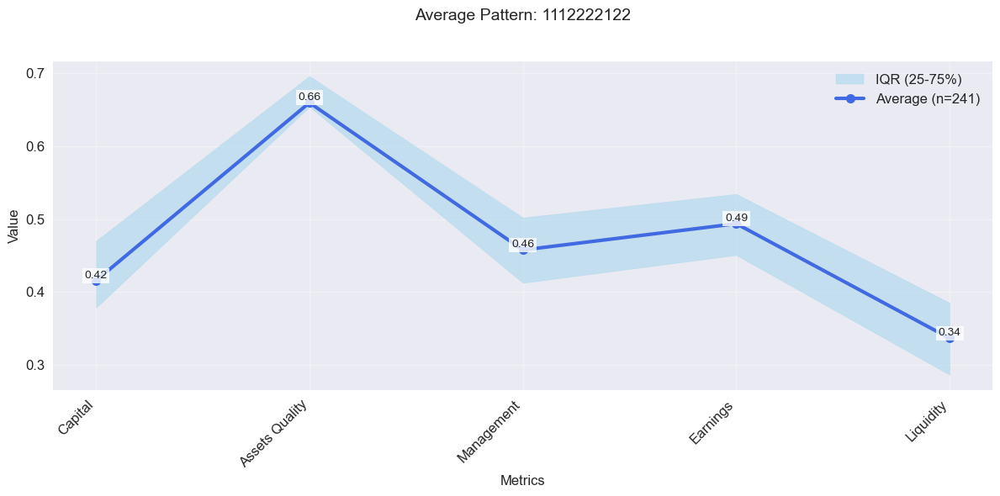

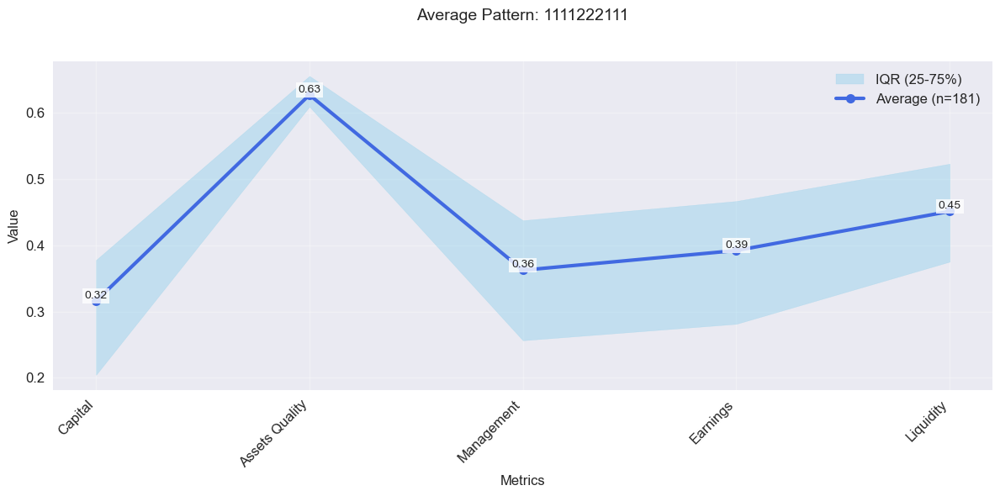

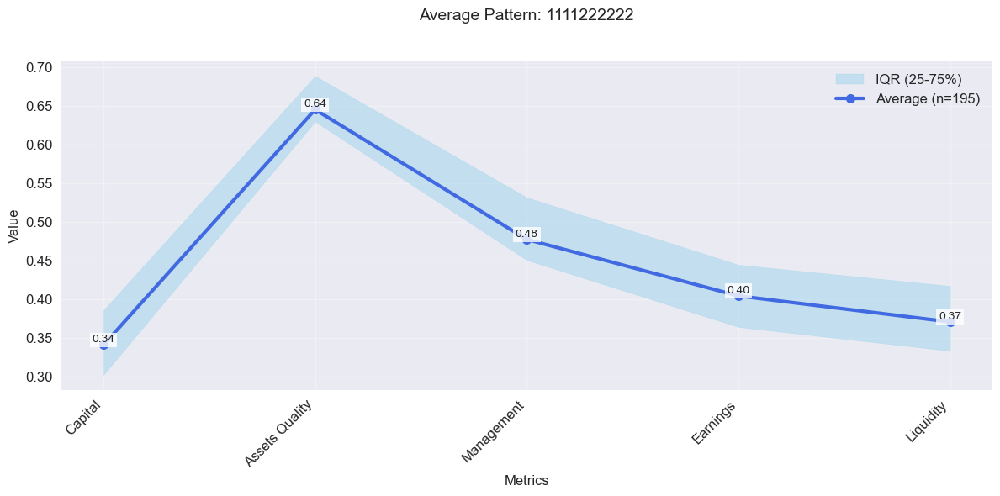

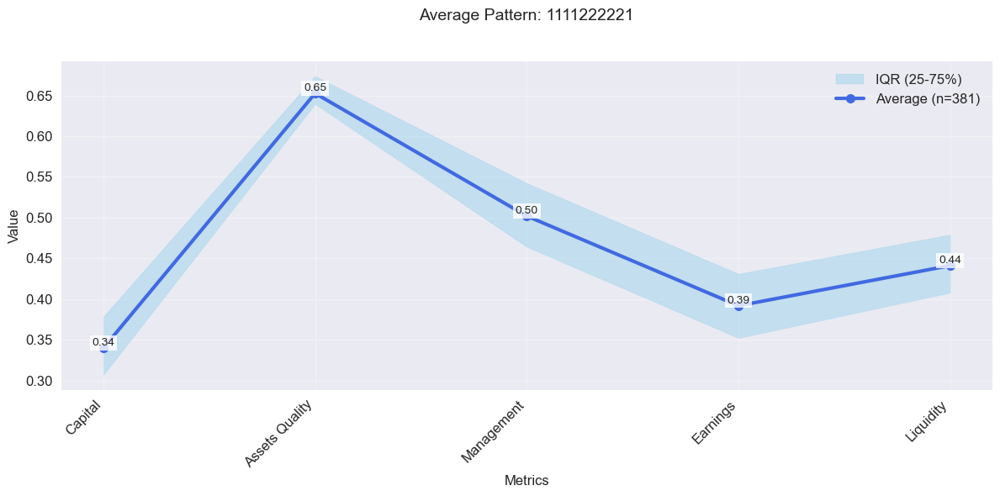

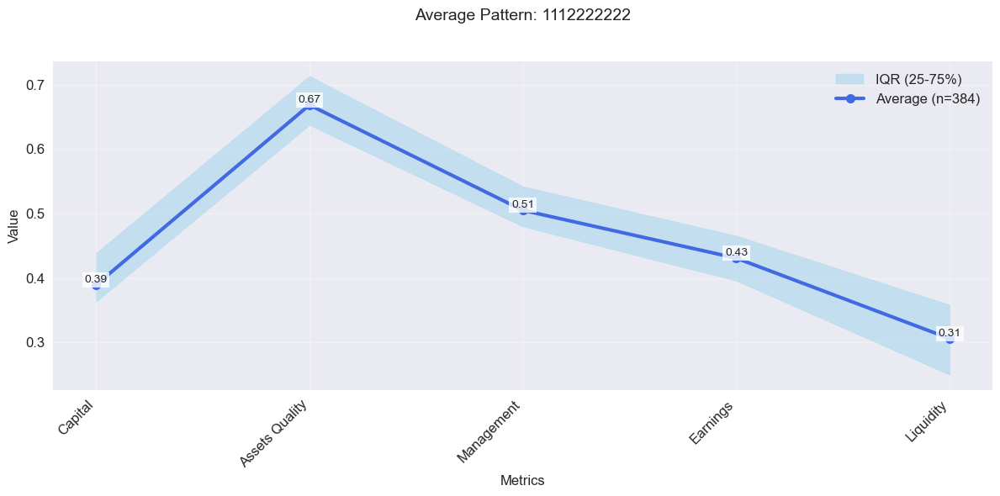

...

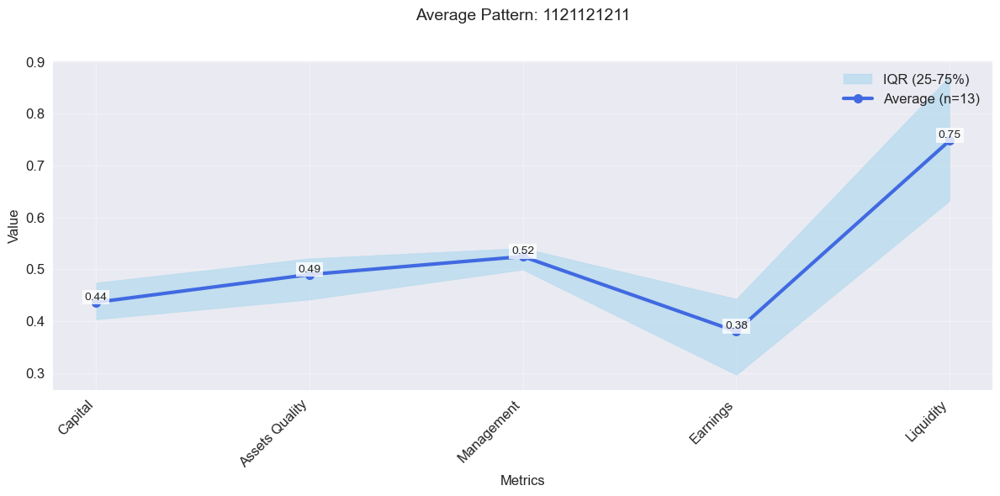

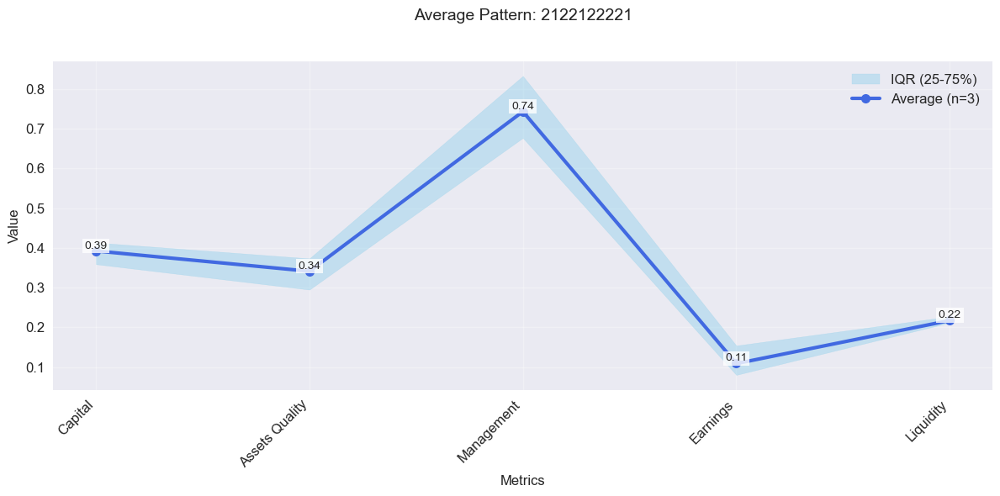

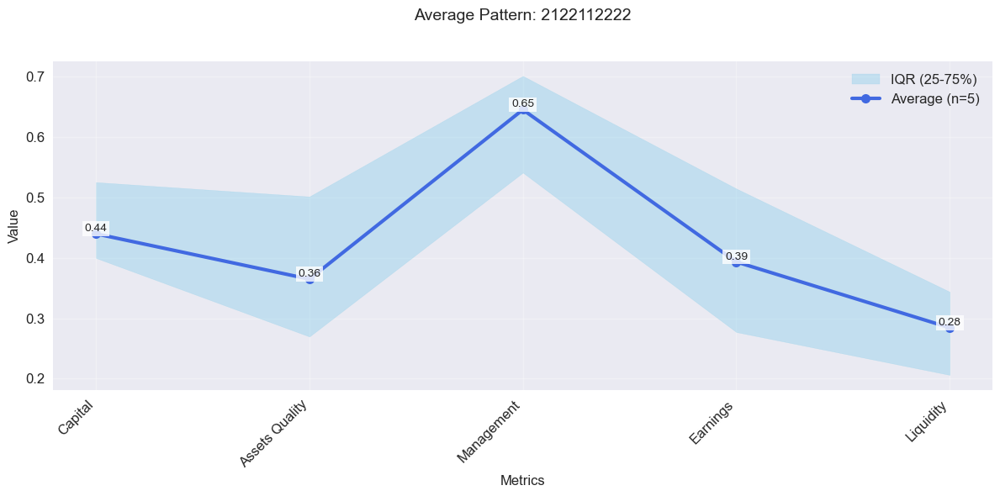

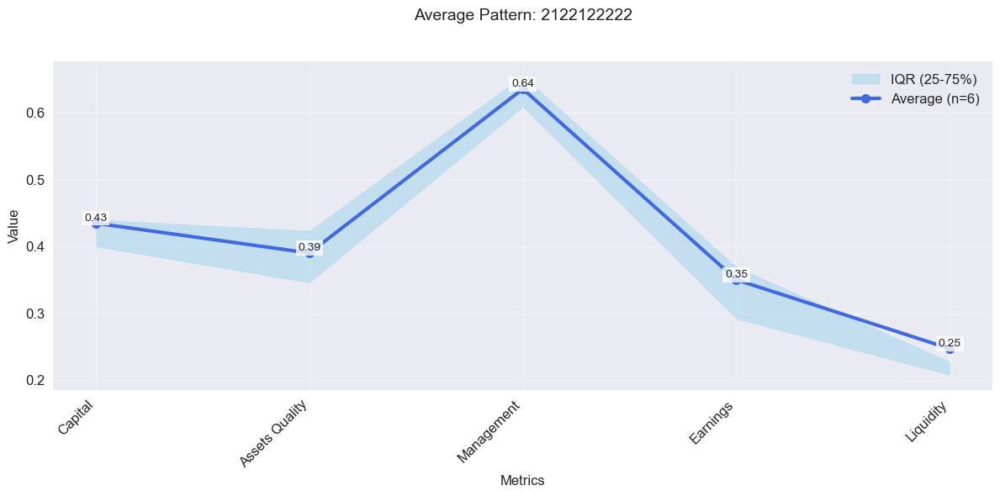

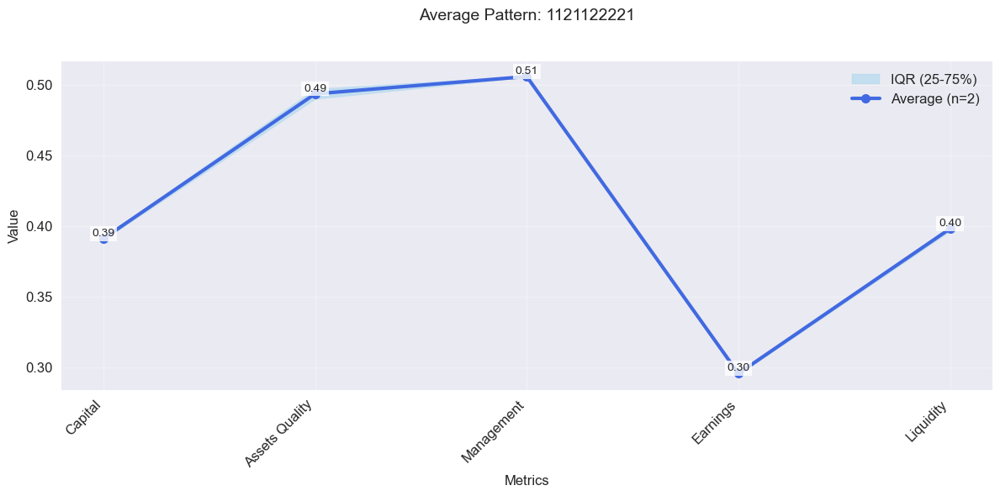

In [60]:
# Создаем папку для сохранения
patterns_output_dir = "patterns_parallel_coords_aver_not_fix"
os.makedirs(patterns_output_dir, exist_ok=True)
plot_average_pattern(df_banks)

In [42]:
# Создаем таблицу, в каждой строке которой приведен банк и его паттерны за каждый доступный период
date_range = pd.date_range(start='2020-01-01', end='2024-12-31', freq='MS') 

all_banks = df_banks['REGN'].unique()
pattern_table = pd.DataFrame(index=all_banks, 
                            columns=[dt.strftime('%Y-%m') for dt in date_range])

# Заполняем таблицу паттернами
for regn in all_banks:
    bank_data = df_banks[df_banks['REGN'] == regn]
    for dt in date_range:
        mask = (bank_data['DT'].dt.to_period('M') == dt.to_period('M'))
        if mask.any():
            pattern = bank_data.loc[mask, 'pattern_not_fix'].iloc[0]
            pattern_table.loc[regn, dt.strftime('%Y-%m')] = pattern
        else:
            pattern_table.loc[regn, dt.strftime('%Y-%m')] = None
            
analysis_table = pattern_table.loc[:, ~pattern_table.columns.str.contains('DATA GAP')]

In [43]:
pattern_table

,2020-01,2020-02,2020-03,2020-04,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,...,2024-03,2024-04,2024-05,2024-06,2024-07,2024-08,2024-09,2024-10,2024-11,2024-12
1,1112222122,1111222111,1111222222,1111222221,1111222222,1111222222,1112222222,1111222122,1111222122,1111222222,...,2212212122,None,2212212122,None,None,None,None,None,None,None
2,2222112122,2212112122,2212111122,2222111122,2212111112,2222111122,None,2222112122,2222222122,2222221111,...,None,None,None,None,None,None,None,None,None,None
21,1111222221,1111222211,1111222221,1111222211,1111222221,1111222211,1111222211,1111222221,1111221211,1111221211,...,None,None,None,None,None,None,None,None,None,None
53,1212222112,1212222112,1212222112,1212222112,1212222112,1212222112,1212222112,1212222112,1212222112,1212222112,...,2212212112,2212212112,2212212112,2212212112,2212212112,2212212112,2212212112,2212212112,2212212112,2212212112
67,1222222222,1222222222,1222222222,1222222222,1222222222,1222222222,1222222221,1222222221,1222222222,1222222221,...,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3524,1112222222,1112222222,1112222222,None,1112222222,1112222222,1112222222,1112222222,1112222222,1112222222,...,1112222122,1112222122,2112111222,1112112222,1112112122,None,1112112122,2112112122,1112222122,1112222222
3525,1111222211,1111221211,1111221211,1111221211,1121222211,1121222221,1121222211,1121221211,1121222211,1121221211,...,2212212112,2212212112,2212212112,2212212112,2212212112,2212212112,2212212112,2212212112,2212212112,2212212112
3527,1111222221,1111222221,1111222221,1111222221,1111222221,1111222221,1111222221,1111222221,1111222221,1111222221,...,None,None,None,None,None,None,None,None,None,None
3529,2222222211,2222222221,None,2222222221,2222222221,2222222221,2222222221,2222222222,None,2222222222,...,None,None,None,2212211112,2212211112,None,None,None,None,None


In [44]:
# Функции для классификации банков
def classify_bank(patterns):
    # Удаляем пропущенные значения
    clean_patterns = patterns.dropna()
    unique_patterns = clean_patterns.unique()
    n_unique = len(unique_patterns)
    
    if n_unique == 0:
        return 'NO_DATA'
    
    # Разделяем на периоды до и после марта 2022 года
    pre_2022 = clean_patterns[clean_patterns.index < '2022-03']
    post_2022 = clean_patterns[clean_patterns.index > '2022-03']
    
    # Получаем паттерны
    original_pattern = pre_2022.iloc[0] if len(pre_2022) > 0 else None
    last_pre_pattern = pre_2022.iloc[-1] if len(pre_2022) > 0 else None
    first_post_pattern = post_2022.iloc[0] if len(post_2022) > 0 else None
    last_post_pattern = post_2022.iloc[-1] if len(post_2022) > 0 else None
    
    # Проверяем стабильность после санкций
    post_stable = (post_2022.nunique() == 1) if len(post_2022) > 0 else True
    pre_changes = pre_2022[pre_2022 != pre_2022.shift()]    
    
    # Новая группа: менялись до санкций, но стабильны после
    if len(pre_2022) > 0 and post_stable:
        if last_post_pattern == last_pre_pattern and (len(pre_changes) - 1) == 1:
            return 'POST_SANCTION_STABLE'
    
    # Остальная логика классификации
    if n_unique == 1:
        return 'STABLE'
    
    # Проверяем, что до марта 2022 паттерн не менялся (для остальных групп)
    pre_2022_stable = (pre_2022.nunique() == 1) if len(pre_2022) > 0 else True
    
    if not pre_2022_stable:
        return 'MULTIPLE_CHANGES'
    
    # Анализируем изменения после марта 2022
    post_changes = post_2022[post_2022 != post_2022.shift()]
    n_post_changes = len(post_changes) - 1
    
    # Классификация остальных групп
    if last_post_pattern == original_pattern:
        return 'TEMPORARY_CHANGE' if n_post_changes <= 1 else 'MULTIPLE_CHANGES'
    elif n_post_changes == 0:
        return 'PERMANENT_CHANGE' if first_post_pattern != original_pattern else 'STABLE'
    elif n_post_changes == 1:
        if (first_post_pattern == original_pattern and last_post_pattern != original_pattern) or \
           (first_post_pattern != original_pattern and first_post_pattern == last_post_pattern):
            return 'PERMANENT_CHANGE'
        else:
            return 'MULTIPLE_CHANGES'
    else:
        return 'MULTIPLE_CHANGES'
# Применяем классификацию
bank_groups = pattern_table.apply(classify_bank, axis=1).value_counts()

# Создаем DataFrame с классификацией
bank_classification = pd.DataFrame({
    'REGN': analysis_table.index,
    'Group': analysis_table.apply(classify_bank, axis=1)
})

# Детализация по группам
def get_pattern_info(patterns):
    clean_patterns = patterns.dropna()
    if len(clean_patterns) == 0:
        return np.nan, np.nan, 0
    
    main_pattern = clean_patterns.mode()[0]
    changes = (clean_patterns != clean_patterns.shift()).sum() - 1
    return main_pattern, clean_patterns.iloc[0], changes

pattern_info = analysis_table.apply(get_pattern_info, axis=1, result_type='expand')
pattern_info.columns = ['Main_Pattern', 'First_Pattern', 'Changes_Count']

bank_classification = bank_classification.join(pattern_info)

In [45]:
bank_classification['Group'].value_counts()

MULTIPLE_CHANGES    262
PERMANENT_CHANGE      3
STABLE                1
Name: Group, dtype: int64

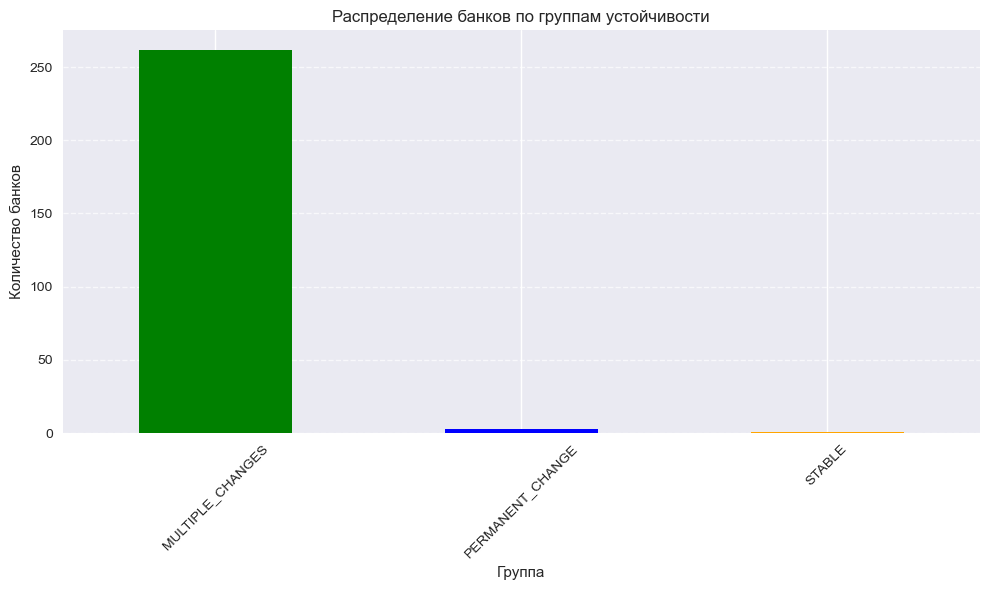

In [46]:
# Создаем папку для сохранения
patterns_output_dir = "patterns_distibution_not_fix"
os.makedirs(patterns_output_dir, exist_ok=True)
# Визуализация распределения групп
plt.figure(figsize=(10, 6))
bank_groups.plot(kind='bar', color=['green', 'blue', 'orange', 'red'])
plt.title('Распределение банков по группам устойчивости')
plt.xlabel('Группа')
plt.ylabel('Количество банков')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
filename = os.path.join(patterns_output_dir, f"distribution.png")
plt.savefig(filename, dpi=300, bbox_inches='tight')
plt.show()

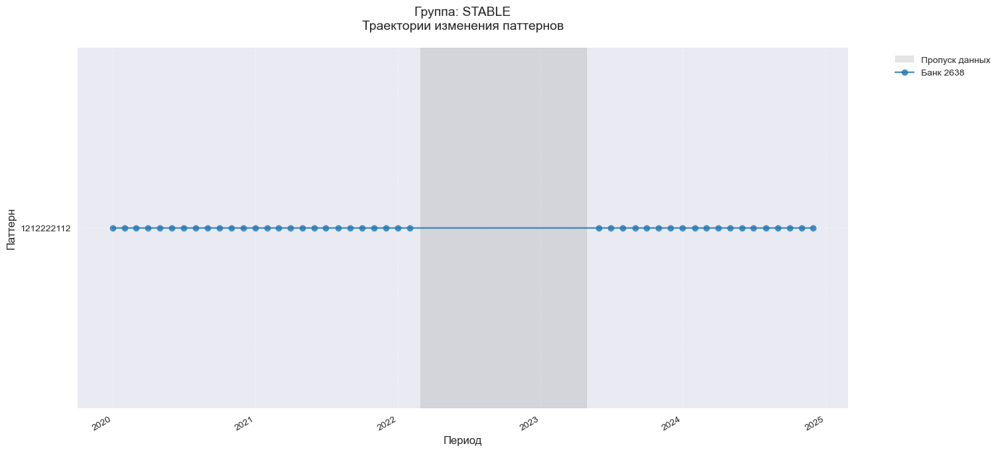

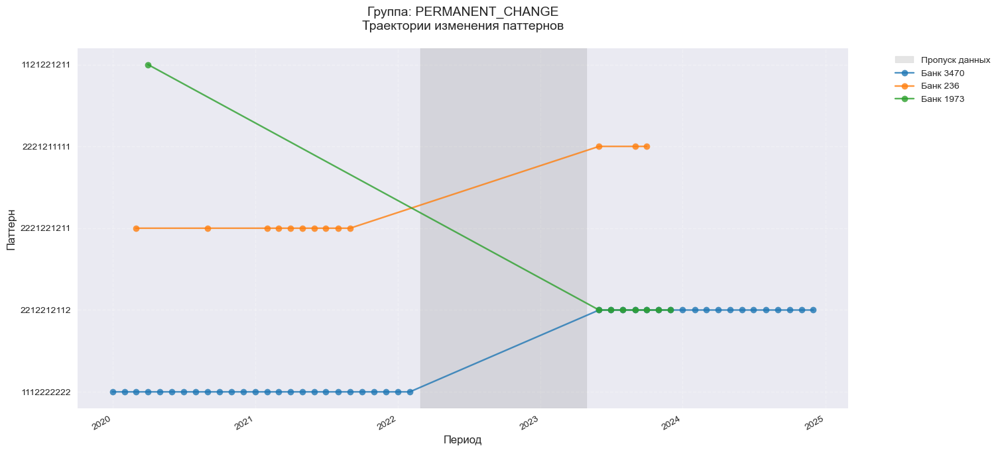

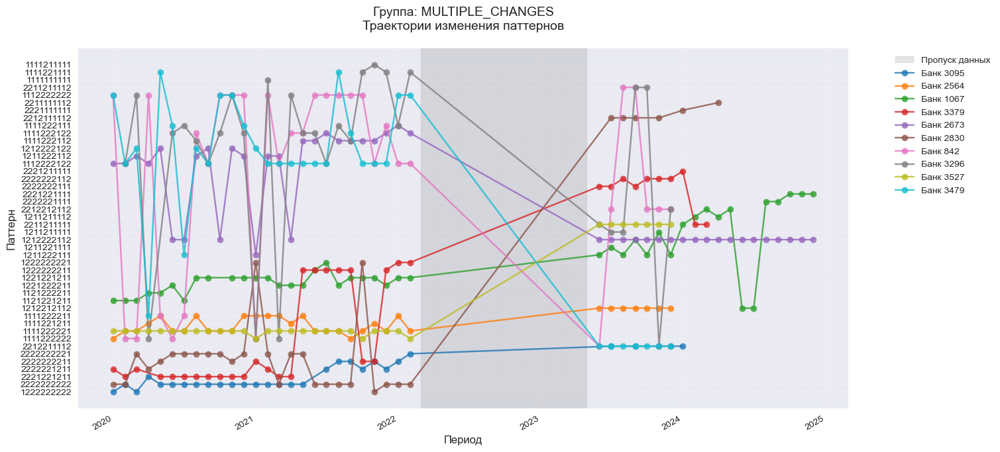

In [47]:
# Создаем папку для сохранения групповых графиков
group_output_dir = "group_patterns_plots_not_fix"
os.makedirs(group_output_dir, exist_ok=True)


plt.style.use('seaborn')
colors = plt.cm.tab10(np.linspace(0, 1, 10))  # 10 различных цветов

def plot_group_patterns(group_name, sample_size=10):
    # Выбираем банки из группы
    group_banks = bank_classification[bank_classification['Group'] == group_name].index
    if len(group_banks) == 0:
        return
    
    # Берем sample_size случайных банков (или все, если их меньше)
    sample_banks = np.random.choice(group_banks, size=min(sample_size, len(group_banks)), replace=False)
    
    plt.figure(figsize=(15, 8))
    ax = plt.gca()
    
    # Область пропущенных данных
    ax.axvspan(pd.Timestamp('2022-03-01'), pd.Timestamp('2023-05-01'), 
               color='gray', alpha=0.2, label='Пропуск данных')
    
    
    # Рисуем паттерны для каждого банка
    for i, regn in enumerate(sample_banks):
        bank_data = pattern_table.loc[regn].dropna()
        dates = pd.to_datetime(bank_data.index + '-01')
        plt.plot(dates, bank_data, 
                marker='o', linestyle='-', 
                color=colors[i],
                label=f'Банк {regn}',
                alpha=0.8)
    
    # Настройки графика
    plt.title(f'Группа: {group_name}\nТраектории изменения паттернов', fontsize=14, pad=20)
    plt.xlabel('Период', fontsize=12)
    plt.ylabel('Паттерн', fontsize=12)
    
    # Легенда
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Сетка
    plt.grid(True, linestyle='--', alpha=0.3)
    
    # Форматирование дат
    plt.gcf().autofmt_xdate()

    
    # Сохраняем
    filename = f"{group_output_dir}/{group_name}_patterns.png"
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

# Создаем графики для всех групп
for group in ['STABLE', 'POST_SANCTION_STABLE', 'TEMPORARY_CHANGE', 'PERMANENT_CHANGE', 'MULTIPLE_CHANGES']:
    plot_group_patterns(group)

In [48]:
bank_classification[bank_classification['Group']=='STABLE']

,REGN,Group,Main_Pattern,First_Pattern,Changes_Count
2638,2638,STABLE,1212222112,1212222112,0


In [49]:
bank_classification[bank_classification['Group']=='PERMANENT_CHANGE']

,REGN,Group,Main_Pattern,First_Pattern,Changes_Count
236,236,PERMANENT_CHANGE,2221221211,2221221211,1
1973,1973,PERMANENT_CHANGE,2212212112,1121221211,1
3470,3470,PERMANENT_CHANGE,1112222222,1112222222,1
